# EDA for Image Data

## Import Modules

In [1]:
import pandas as pd
import numpy as np

import os
from math import sqrt, ceil
from joblib import Parallel, delayed

from enum import Enum
from typing import Union, NoReturn

import cv2
import imagehash

import seaborn as sns
import matplotlib.pyplot as plt

### Get Data

In [2]:
train_directory = "../input/train_images/"
test_directory = "../input/test_images/"

In [3]:
train_df = pd.read_csv("../input/train.csv")
test_df = pd.read_csv("../input/test.csv")

In [4]:
n_posting = train_df.shape[0]

### Display Multiple Images (By Condition)

In [5]:
def get_image_paths(path: str, image_names: list[str] = None) -> list[str]:
    if image_names is None:
        image_names = os.listdir(path)

    image_paths = [
        os.path.join(path, image_name)
        for image_name in image_names
    ]
    return image_paths

In [6]:
def display_images(
    image_paths: list[str],
    title: str = None,
    nrows: int = None,
    ncols: int = None,
    figsize: tuple[int, int] = None,
) -> NoReturn:
    count = len(image_paths)

    if not nrows or not ncols:
        nrows = int(ceil(sqrt(count)))
        ncols = int(ceil(count / nrows))

    figure, axes = plt.subplots(
        nrows=nrows,
        ncols=ncols,
        figsize=(figsize if figsize else (16, 16))
    )
    if title:
        plt.suptitle(title, fontsize=16)

    for idx, path in enumerate(image_paths):
        image = cv2.imread(path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        ax = axes.ravel()[idx]
        ax.imshow(image)

    for ax in axes.ravel():
        ax.set_axis_off()

    plt.tight_layout()

In [7]:
class GroupType(Enum):
    LABEL = "label_group"
    TITLE = "title"
    PHASH = "image_phash"

In [8]:
def path_by_condition(group: Union[int, str], mode: GroupType) -> list[str]:
    image_names = train_df.query(
        expr=f"{mode.value} == @group").image

    paths = get_image_paths(
        path=train_directory,
        image_names=image_names
    )
    return paths

### Get Image Paths

In [9]:
train_images = get_image_paths(train_directory)
test_images = get_image_paths(test_directory)

### Check Shape of Images

In [10]:
def get_image_shape(image_path: str) -> tuple[int, int]:
    try:
        return cv2.imread(image_path).shape[:2]
    except Exception:
        return [None, None]


def get_image_shapes(image_paths: list[str]) -> np.array:
    shapes = Parallel(n_jobs=-1)(
        delayed(get_image_shape)(image_path)
        for image_path in image_paths
    )
    return np.array(shapes)

In [11]:
train_shapes = pd.DataFrame(
    data=get_image_shapes(train_images), columns=["width", "height"]
)
train_shapes.dropna(inplace=True)

unique_shapes = train_shapes.groupby(
    ["width", "height"]
).size().reset_index(name="count")

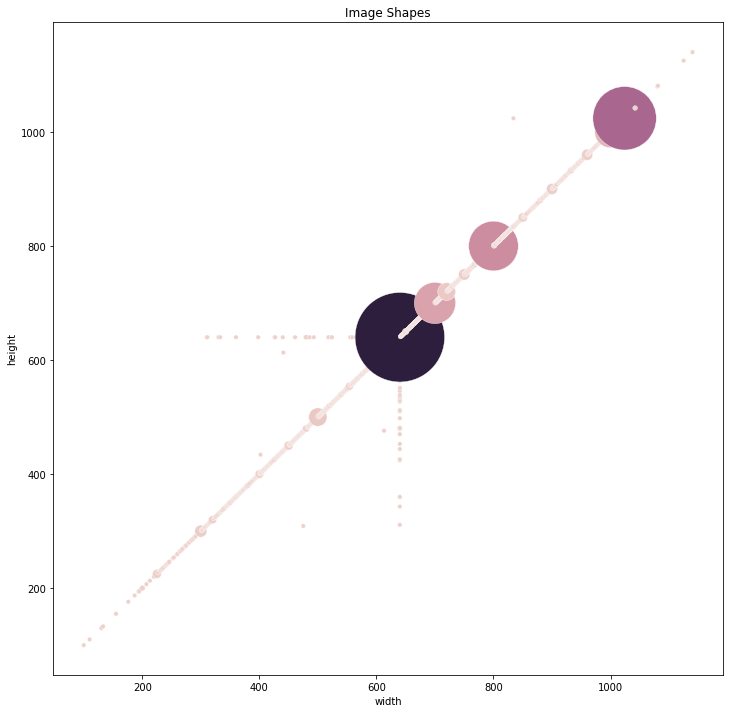

In [12]:
plt.figure(figsize=(12, 12))
sns.scatterplot(
    x="width",
    y="height",
    hue="count",
    size="count",
    sizes=(20, 8000),
    legend=False,
    data=unique_shapes.query("width < 1200"),
)
plt.title("Image Shapes")
plt.show()


### Number of Unique Values by Column

In [13]:
for column in train_df.columns:
    print(f"{column}: {train_df[column].nunique()}")

posting_id: 34250
image: 32412
image_phash: 28735
title: 33117
label_group: 11014


### Train Images

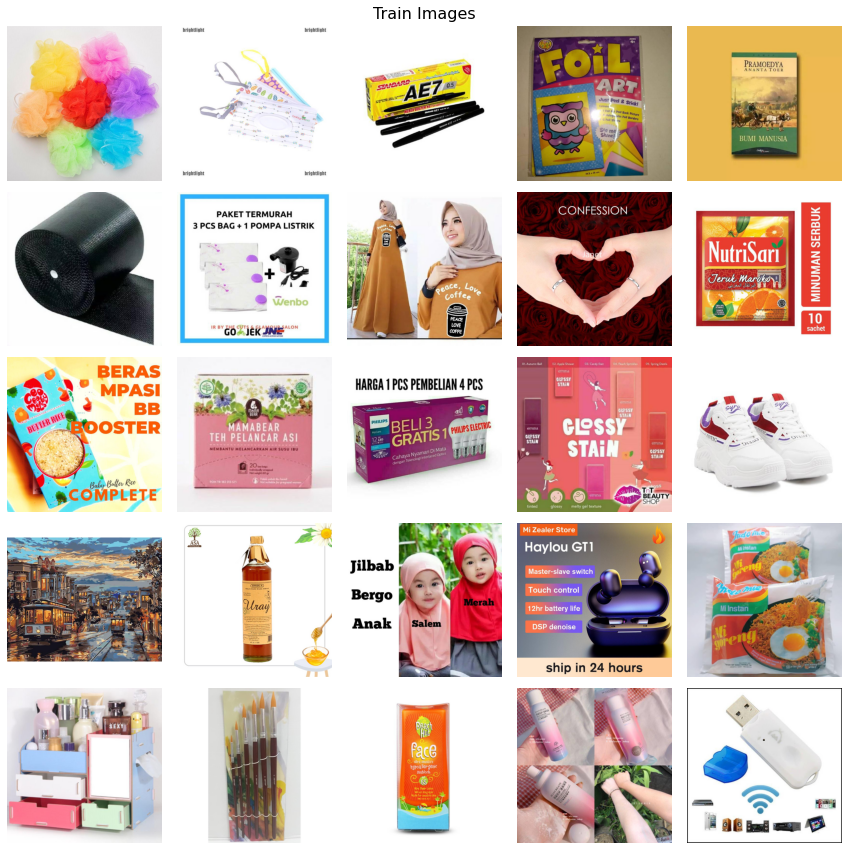

In [14]:
display_images(train_images[:25], title="Train Images", figsize=(12, 12))

### Test Images

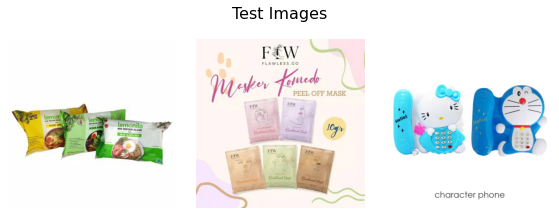

In [15]:
display_images(
    test_images,
    title="Test Images",
    nrows=1,
    ncols=3,
    figsize=(8, 3)
)

### Label Groups

#### Top Image Label Groups

In [16]:
top, count = 15, 10
frequent_labels = train_df.label_group.value_counts()

Text(0.5, 1.0, 'Distribution')

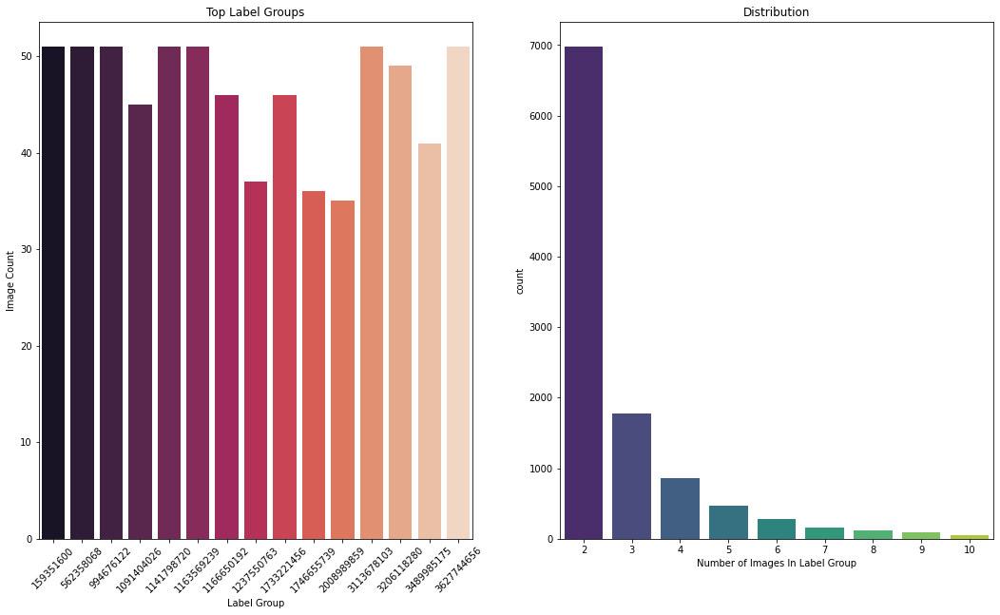

In [17]:
figure, (ax1, ax2) = plt.subplots(ncols=2, figsize=(18, 10))
sns.barplot(
    x="index",
    y="label_group",
    data=frequent_labels[:top].reset_index(),
    palette="rocket",
    ax=ax1,
)
ax1.set_xlabel("Label Group")
ax1.set_ylabel("Image Count")

ax1.tick_params(axis="x", rotation=45)
ax1.set_title("Top Label Groups")

sns.countplot(
    x=frequent_labels[frequent_labels <= count],
    palette="viridis",
    ax=ax2,
)
ax2.set_xlabel("Number of Images In Label Group")
ax2.set_title("Distribution")

### Most Frequent Label Group

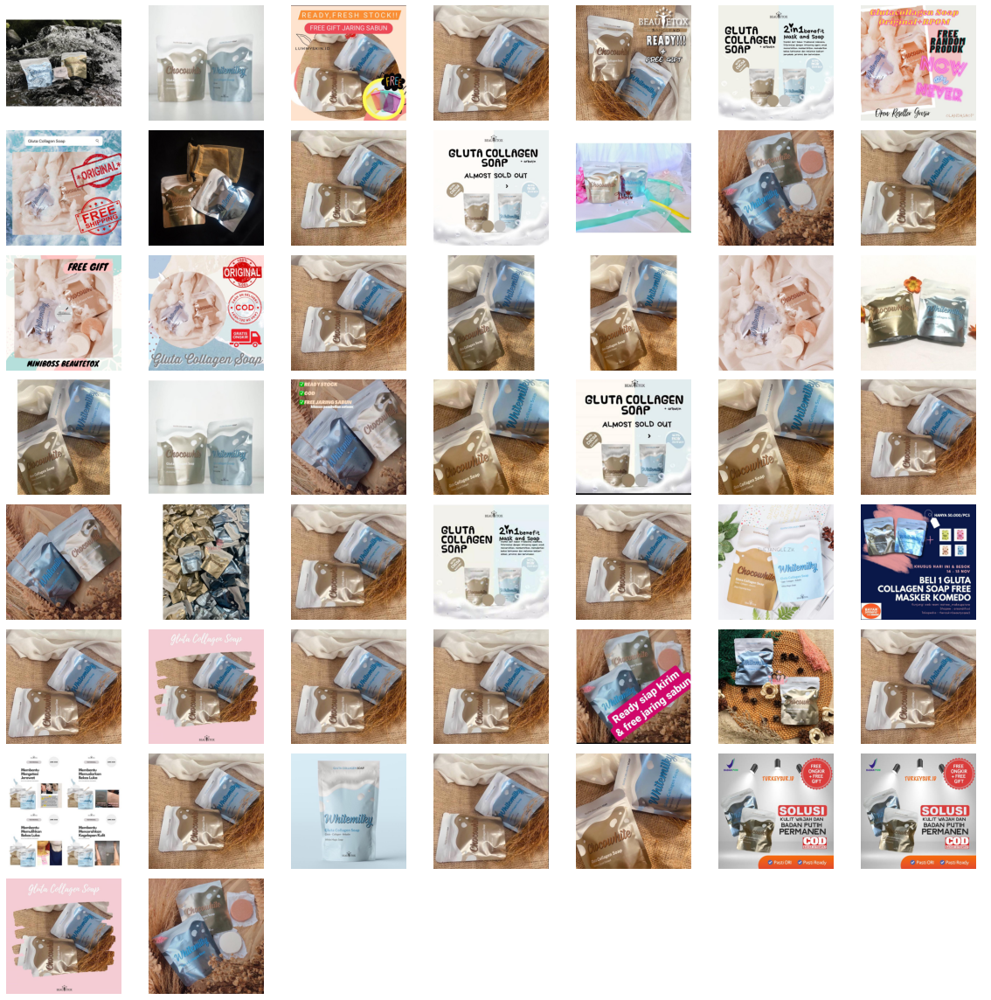

In [18]:
display_images(
    image_paths=path_by_condition(
        group=159351600,
        mode=GroupType.LABEL
    )
)

### Least Frequent Label Group

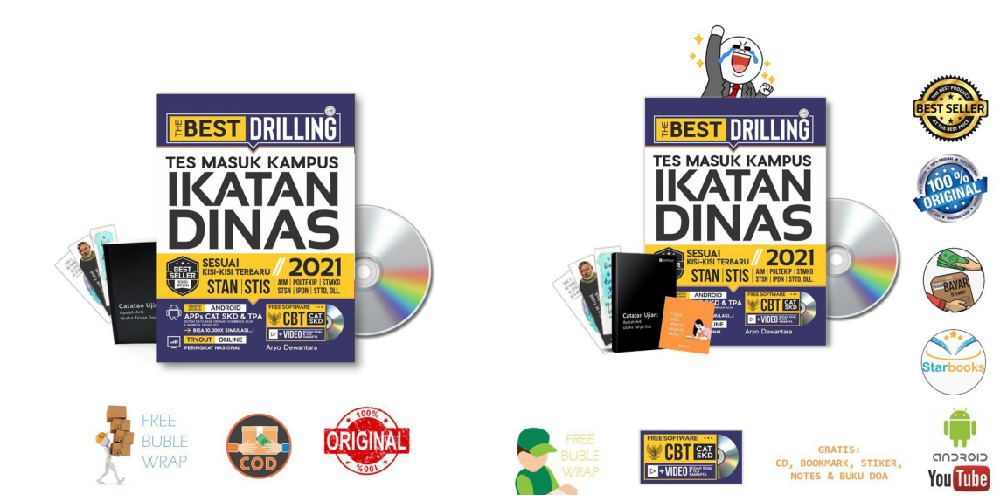

In [19]:
display_images(
    image_paths=path_by_condition(
        group=854939659,
        mode=GroupType.LABEL
    ),
    nrows=1,
    ncols=2,
)

### Image Titles

In [20]:
frequent_titles = train_df.title.value_counts()
frequent_titles.reset_index()[:10]

,index,title
0,Koko syubbanul muslimin koko azzahir koko baju,9
1,Baju Koko Pria Gus Azmi Syubbanul Muslimin Kom...,8
2,100 Pcs Ikat Rambut Karet Polos Elastis Gaya K...,6
3,Monde Boromon Cookies 1 tahun+ 120gr,6
4,Emina Glossy Stain,6
5,Viva Air Mawar,6
6,24Pc False Nail Art tips Matte Nude Coffin Bal...,5
7,Herborist Lulur Tradisional Bali 100gr,5
8,Avoskin Miraculous Retinol Toner,5
9,Shannen lipstik shanen creamy lip paint,5


### Top-3 Most Frequent Image Groups By Title

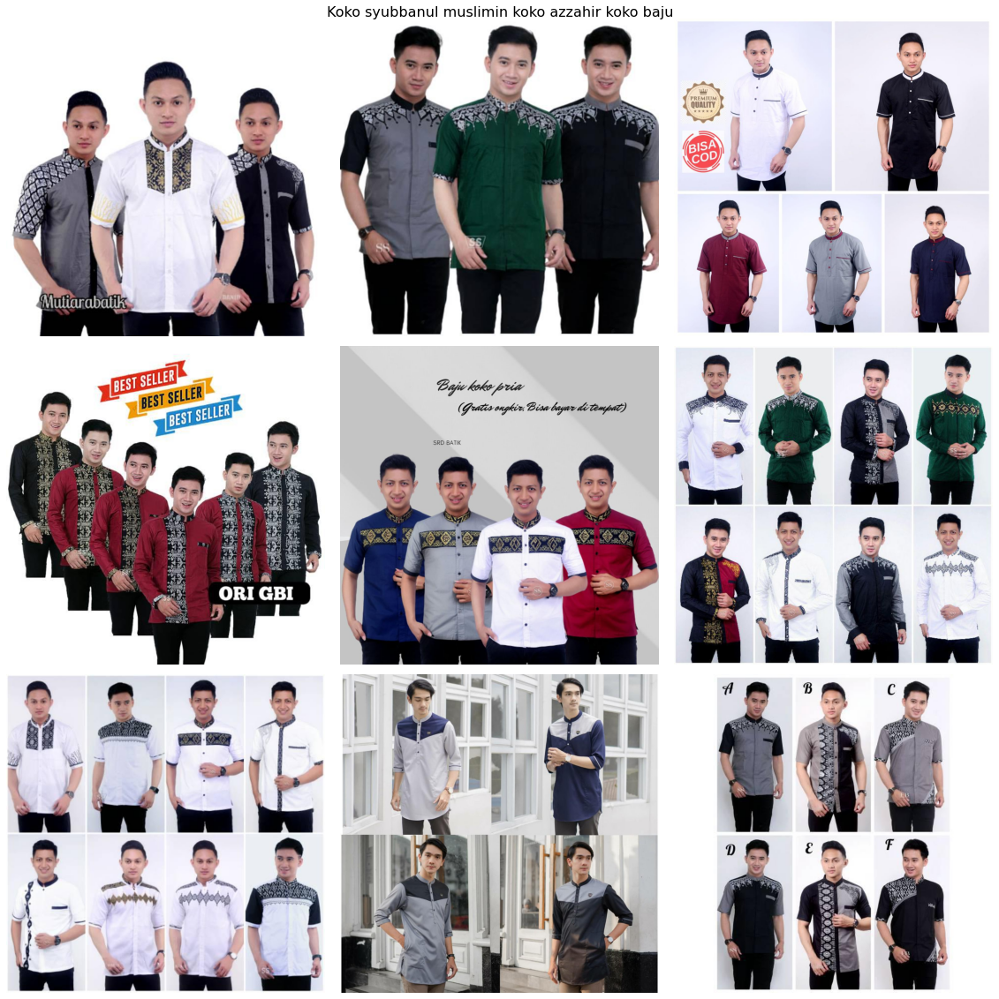

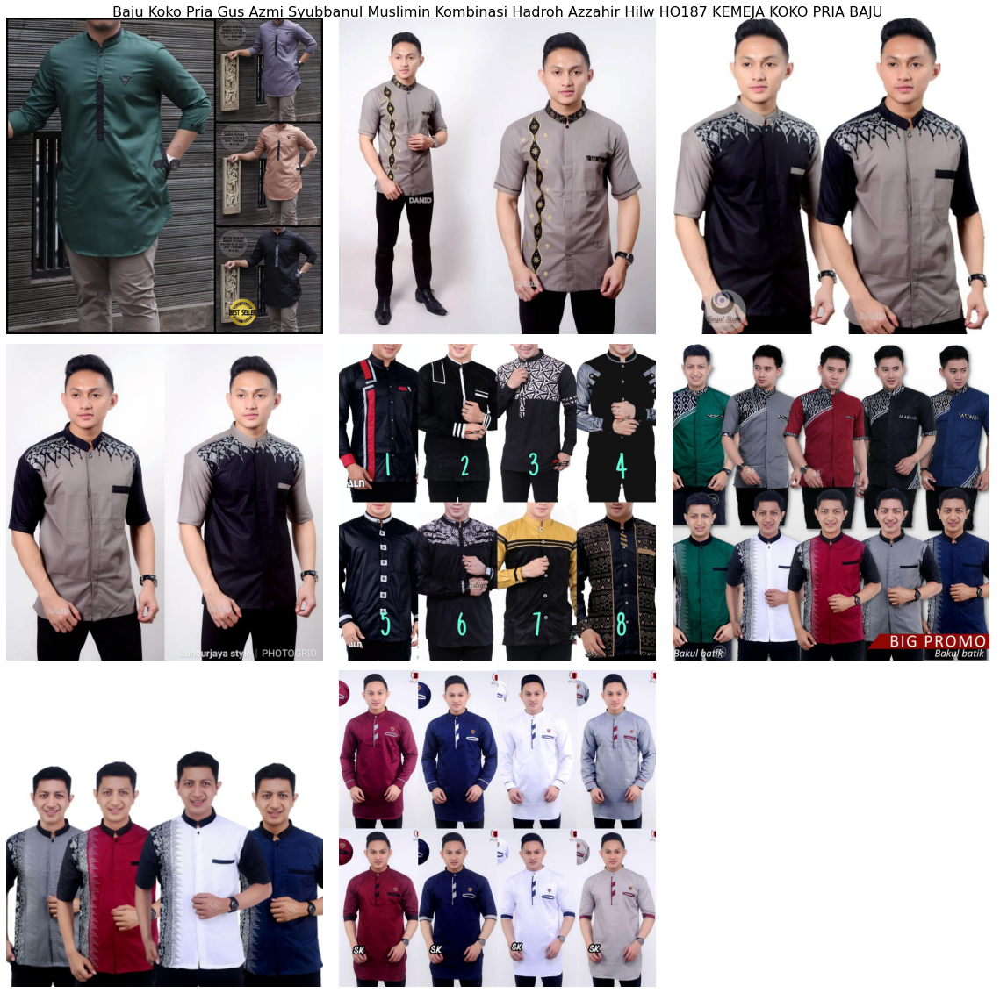

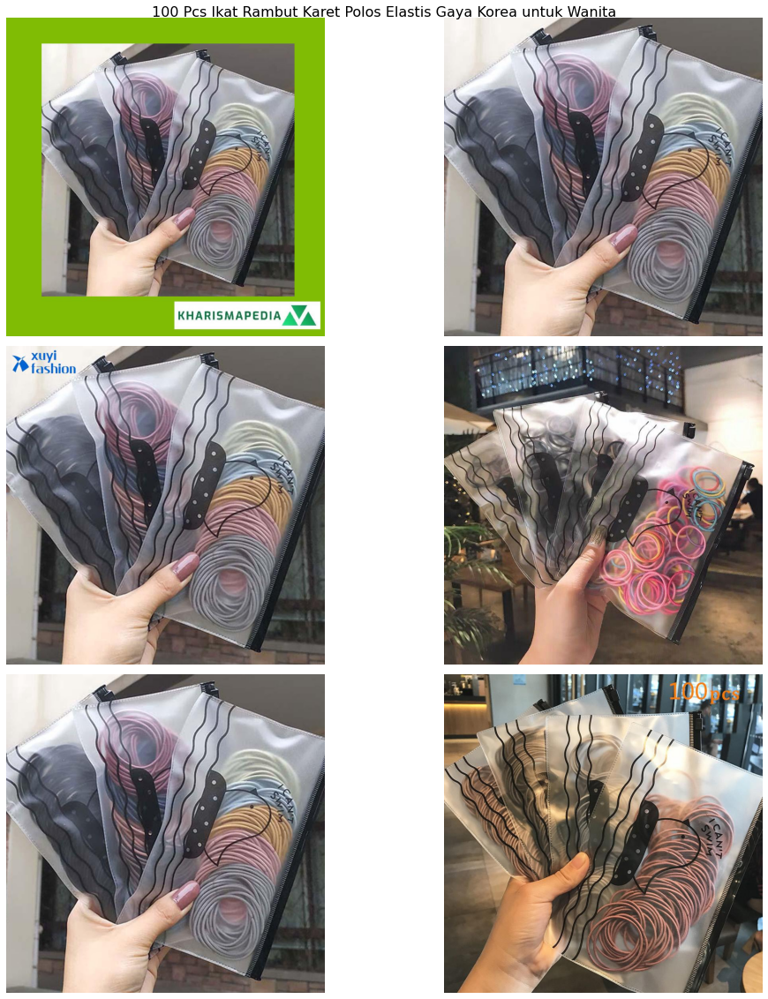

In [21]:
for image_title in frequent_titles.index[:3]:
    display_images(
        image_paths=path_by_condition(
            group=image_title,
            mode=GroupType.TITLE
        ),
        title=image_title,
    )

### Image Phash

#### Understanding Image Phash

In [22]:
phash = train_df.image_phash[0]
imagehash.hex_to_hash(phash)

array([[ True, False, False,  True, False,  True, False, False],
       [ True, False, False,  True, False,  True,  True,  True],
       [False,  True, False, False,  True,  True,  True,  True],
       [ True, False, False,  True, False, False,  True,  True],
       [False,  True,  True,  True,  True,  True, False,  True],
       [False,  True, False, False,  True,  True, False, False],
       [False, False,  True, False, False,  True, False, False],
       [False, False,  True,  True, False, False,  True,  True]])

#### Compute Phash Distances

In [23]:
def compute_phash_distances(hexes: pd.Series) -> np.ndarray:
    hashes = hexes.apply(imagehash.hex_to_hash)
    data = hashes.values

    hash_matrix = np.tile(data, (data.size, 1))
    distances = hash_matrix - data[:, None]

    return distances

In [24]:
hexes = train_df.image_phash[:10]
pd.DataFrame(compute_phash_distances(hexes))

,0,1,2,3,4,5,6,7,8,9
0,0,42,40,30,32,34,32,30,38,36
1,42,0,28,28,34,32,36,24,28,32
2,40,28,0,34,44,26,34,32,28,32
3,30,28,34,0,34,40,30,32,34,30
4,32,34,44,34,0,32,30,30,36,30
5,34,32,26,40,32,0,30,36,26,36
6,32,36,34,30,30,30,0,34,30,32
7,30,24,32,32,30,36,34,0,28,36
8,38,28,28,34,36,26,30,28,0,32
9,36,32,32,30,30,36,32,36,32,0


#### Images With The Same Phash

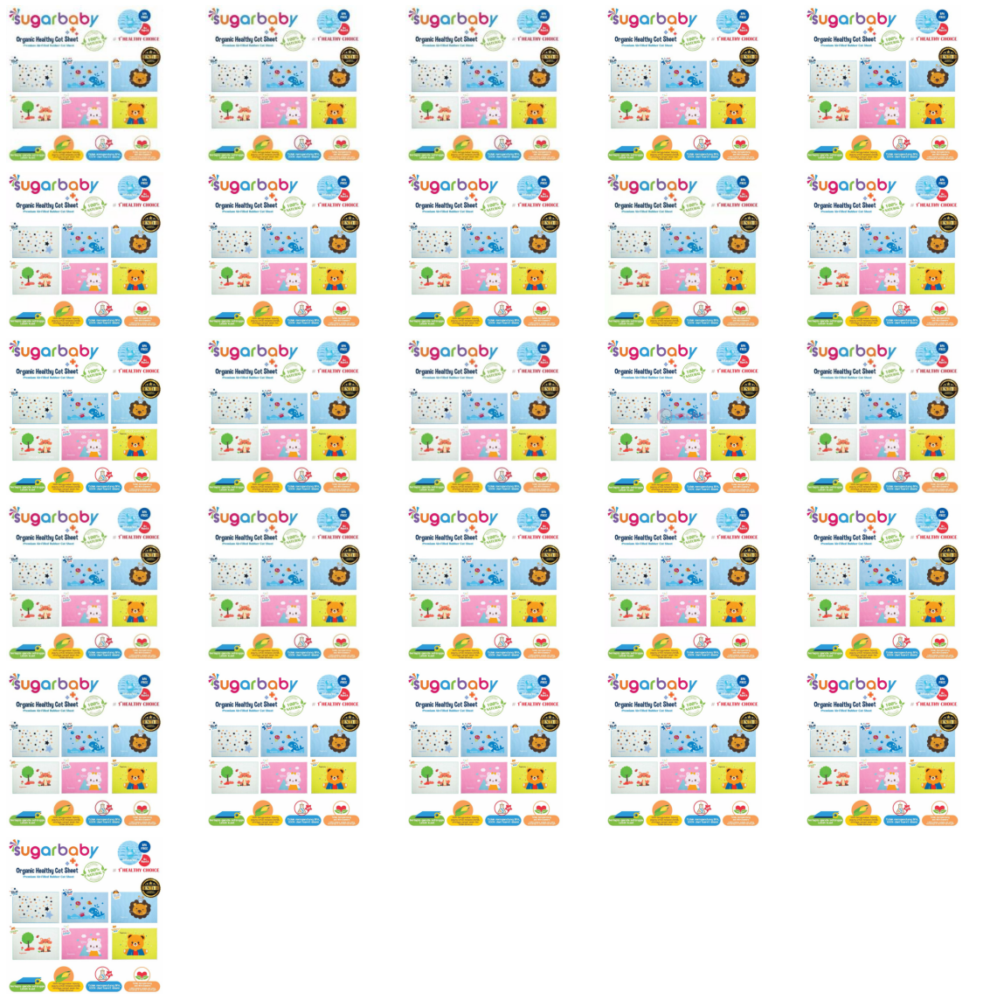

In [25]:
display_images(
    image_paths=path_by_condition(
        group="fad28daa2ad05595",
        mode=GroupType.PHASH
    )
)